# 10. Mixture models and label switching with MCMC

[Data set download](https://s3.amazonaws.com/bebi103.caltech.edu/data/singer_transcript_counts.csv)

<hr>

In [1]:
# Colab setup ------------------
import os, sys, subprocess
if "google.colab" in sys.modules:
    cmd = "pip install --upgrade iqplot colorcet bebi103 arviz cmdstanpy watermark"
    process = subprocess.Popen(cmd.split(), stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    stdout, stderr = process.communicate()
    import cmdstanpy; cmdstanpy.install_cmdstan()
    data_path = "https://s3.amazonaws.com/bebi103.caltech.edu/data/"
else:
    data_path = "../data/"
# ------------------------------

/Users/bois/opt/anaconda3/lib/python3.9/site-packages/colorcet/__init__.py:74: UserWarning: Trying to register the cmap 'cet_gray' which already exists.
  register_cmap("cet_"+name, cmap=cm[name])
/Users/bois/opt/anaconda3/lib/python3.9/site-packages/colorcet/__init__.py:74: UserWarning: Trying to register the cmap 'cet_gray_r' which already exists.
  register_cmap("cet_"+name, cmap=cm[name])


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
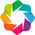

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
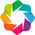

Loading BokehJS ...

In [2]:
import numpy as np
import scipy.stats as st
import pandas as pd

import cmdstanpy
import arviz as az

import iqplot
import bebi103

import holoviews as hv
hv.extension('bokeh')

import bokeh.io
import bokeh.plotting
bokeh.io.output_notebook()

We continue with our analysis of the smFISH data, but this time for the Rex1 gene. Here, we saw clear bimodality in the data.

In [3]:
# Load DataFrame and get counts
df = pd.read_csv(os.path.join(data_path, "singer_transcript_counts.csv"), comment="#")
n = df["Rex1"].values

bokeh.io.show(
    iqplot.ecdf(n, x_axis_label="mRNA count", frame_height=150, frame_width=200)
)

## Mixture models

Since the Negative Binomial distribution is unimodal, what could be the story here?  It is quite possible we are seeing two different states of cells, one with one level of bursty expression of the gene of interest, and another with a higher level of bursty expression. This could mean the cells are differentiating. So, we would expect the number of mRNA transcripts to be distributed according to a linear combination of two negative binomial distributions. We can write out the PMF as

\begin{align}
f(n\mid \alpha_1, \alpha_2, \beta_1, \beta_2, w) &= 
w\,\frac{\Gamma(n + \alpha_1)}{n!\,\Gamma(\alpha_1)}\,\left(\frac{\beta_1}{1+\beta_1}\right)^{\alpha_1}\left(\frac{1}{1+\beta_1}\right)^{n} \\[1em]
&\;\;\;\;+ (1-w) \,\frac{\Gamma(n + \alpha_2)}{n!\,\Gamma(\alpha_2)}\,\left(\frac{\beta_2}{1+\beta_2}\right)^{\alpha_2}\left(\frac{1}{1+\beta_2}\right)^{n} ,
\end{align}

where $w$ is the probability that the burst size and frequency are determined by $1/\beta_1$ and $\alpha_1$. Such a model, in which a variable is distributed as a linear combination of distributions, is called a **mixture model**.

For this case, we can write this likelihood more concisely as

\begin{align}
n_i \sim w \, \text{NegBinom}(\alpha_1, \beta_1) + (1-w)\,\text{NegBinom}(\alpha_2, \beta_2)\;\;\forall i.
\end{align}

We have to specify priors on $\alpha_1$, $\beta_1$, $\alpha_2$, $\beta_2$, and $w$. We can retain the same priors from the previous lesson for the $\alpha$'s and $\beta$'s, and we will assume a Uniform prior for $w$. We then have the following model.

\begin{align}
&\log_{10} \alpha_i \sim \text{Norm}(0,1) \text{ for } i \in [1, 2] \\[1em]
&\log_{10} b_i \sim \text{Norm}(2, 1) \text{ for } i \in [1, 2], \\[1em]
&\beta_i = 1/b_i,\\[1em]
&w \sim \text{Beta}(1, 1), \\[1em]
&n_i \sim w \, \text{NegBinom}(\alpha_1, \beta_1) + (1-w)\,\text{NegBinom}(\alpha_2, \beta_2)\;\;\forall i.
\end{align}

Note that since the prior for $w$ is Uniform (Beta(1, 1)), we do not need to explicitly consider its prior, but simply enforce constrains on $w$.

## Coding up a mixture model

There are a few considerations for coding up a mixture model that also introduce Stan syntax. Importantly, under the hood, Stan uses the log posterior, as do almost all samplers, when sampling out of the posterior. Dealing with a mixture model presents a unique challenge for computing the log likelihood (which is one of the summands of the log posterior). Consider the log likelihood in the present example.

\begin{align}
\ln f(n\mid \alpha_1, \alpha_2, \beta_1, \beta_2, w) = \ln(w\,a_1 + (1-w)a_2),
\end{align}

where

\begin{align}
a_i = \frac{\Gamma(n + \alpha_i)!}{n!\,\Gamma(\alpha_i)}\,\left(\frac{\beta_i}{1+\beta_i}\right)^{\alpha_i}\left(\frac{1}{1+\beta_i}\right)^{n}.
\end{align}

While the logarithm of a product is conveniently split, we cannot split the logarithm of a sum. If we consider the sum directly, we will get serious underflow errors for parameters for which the terms $a_1$ or $a_2$ are small. To compute this in a more numerically stable way, we need to use the [log-sum-exp trick](https://en.wikipedia.org/wiki/LogSumExp). Fortunately, Stan has a built-in function to compute the contributions to the log posterior of a mixture, the `log_mix` function. To update the posterior with this `log_mix` function, we need to add to `target`. In Stan, the keyword `target` is a special variable that holds the running sum of the contributions to the log posterior. When you make statements like `theta ~ normal(0.0, 1.0)`, Stan is adding the appropriate terms to `target` under the hood. In the case of mixture models, we need to add to `target` explicitly. More generally, you can add any terms to `target`, and Stan considers these terms as part of the log posterior. The Stan code below implements this for the mixture model.

```stan
data {
  int<lower=0> N;
  int<lower=0> n[N];
}


parameters {
  vector<lower=0>[2] alpha;
  vector<lower=0>[2] b;
  real<lower=0, upper=1> w;
}


transformed parameters {
  vector[2] beta_ = 1.0 ./ b;
}


model {
  // Priors
  alpha ~ lognormal(0.0, 2.3);
  b ~ lognormal(4.6, 2.3);
  w ~ beta(1.0, 1.0);

  // Likelihood
  for (n_val in n) {
    target += log_mix(
      w,
      neg_binomial_lpmf(n_val | alpha[1], beta_[1]),
      neg_binomial_lpmf(n_val | alpha[2], beta_[2])
    );
  }
}
```

In addition to the `log_mix` function, there is some more new syntax.
- To add the contribution of the Negative Binomial PMF to the log posterior, we use `negative_binomial_lpmf`. Every discrete Stan distribution has a function `<distribution>_lpmf` that gives the value of the log PMF, and every continuous distribution has a similar function `<distribution>_lpdf`. The arguments of the function are as you would write them on paper, with a bar (`|`) signifying the conditioning on the parameters.
- In the above, I have specified `alpha`, `b`, and `beta_` as **vectors**. A vector is an array that behaves like a column vector, which means you can do matrix operations with it. It also allows you to do element-wise operations. Notice that I have written 
```
vector[2] beta_ = 1.0 ./ b;
``` 
This means that `beta_` is a 2-vector and that each element is given by the inverse of the corresponding element in `b`. The `./` operator accomplishes this (note the dot in front of the slash). In general, preceding an operator with a `.` indicates that the operation should be done elementwise.
- Note also that Stan is smart enough to know that if I give `alpha` a prior that it needs to assign it independently to each element in `alpha`. The same is of course true for `b`.
- To specify a lower *and* upper bound, we use the `<lower=0, upper=1>` syntax.
- Note the `for` loop construction. `for (n_val in n)` means iterate over each entry in `n`, yielding its value as `n_val` within the loop. The contents of the loop are enclosed in braces. Note that we could equivalently have written the `for` loop as
```stan
  // Likelihood
  for (i in 1:N) {
    target += log_mix(
      w,
      neg_binomial_lpmf(n[i] | alpha[1], beta_[1]),
      neg_binomial_lpmf(n[i] | alpha[2], beta_[2])
    );
  }
```
Here, we are looping over integers starting an 1 and ending at $N$, *inclusive*. You can think of the `1:N` syntax to be kind of like Python's `range()` function. However, unlike Python's `range()`, Stan's range is *inclusive* of the end value.

Now that we have our model set up, let's compile and sample from it! I will use the `seed` kwarg to set the seed for the random number generator to ensure that I always get the same result for illustrative purposes.

In [4]:
sm = cmdstanpy.CmdStanModel(stan_file='mixture.stan')

data = {'n': n, 'N': len(n)}

samples = sm.sample(
    data=data, 
    seed=3252,
    chains=4,
    iter_sampling=1000,
)

samples = az.from_cmdstanpy(posterior=samples)

INFO:cmdstanpy:compiling stan file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/10/mixture.stan to exe file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/10/mixture
INFO:cmdstanpy:compiled model executable: /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/10/mixture
INFO:cmdstanpy:CmdStan start procesing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

INFO:cmdstanpy:CmdStan done processing.


## Parsing the output

Let's look at the results.

In [5]:
samples

Inference data with groups:
	> posterior
	> sample_stats

The `arviz.InferenceData` object has two xarray DataSets, `posterior` and `sample_stats`. We will work extensively with `sample_stats` in future lessons (and find that they are crucial for checking your sampling!), but for now will focus on the `posterior` object that has the samples. You can look at it be expanding the `posterior` view above.

Note now that the `posterior` output is a bit more complex. This is because the parameters `alpha`, `b`, and `beta_` are vector-valued. The entries in the vectors are respectively indexed by indexes `alpha_dim_0`, `b_dim_0`, and `beta__dim_0`. The samples of these vector valued parameters are then three dimensional arrays. The first two dimensions are the `chain` and `draw`, like we have already seen, but the third dimension specifies which element in the vector.

Samples are selecting using xarray data selection, which you can read about in the [xarray docs](http://xarray.pydata.org/en/stable/indexing.html). As an example, to access sample number 478 from chain 2, do the following.

In [6]:
samples.posterior.loc[dict(chain=2, draw=478)]

<xarray.Dataset>
Dimensions:      (alpha_dim_0: 2, b_dim_0: 2, beta__dim_0: 2)
Coordinates:
    chain        int64 2
    draw         int64 478
  * alpha_dim_0  (alpha_dim_0) int64 0 1
  * b_dim_0      (b_dim_0) int64 0 1
  * beta__dim_0  (beta__dim_0) int64 0 1
Data variables:
    alpha        (alpha_dim_0) float64 5.49 2.45
    b            (b_dim_0) float64 31.27 7.269
    w            float64 0.8258
    beta_        (beta__dim_0) float64 0.03198 0.1376
Attributes:
    created_at:                 2021-12-24T02:28:46.989082
    arviz_version:              0.11.4
    inference_library:          cmdstanpy
    inference_library_version:  1.0.0

If you wanted only the value of $\alpha_2$ from that sample, you would do (noting the zero-based indexing of xarrays):

In [7]:
samples.posterior["alpha"].loc[dict(chain=2, draw=478, alpha_dim_0=1)]

<xarray.DataArray 'alpha' ()>
array(2.44983)
Coordinates:
    chain        int64 2
    draw         int64 478
    alpha_dim_0  int64 1

If you wanted it as a scalar, you would use the `values` attribute and convert the resulting zero-dimension Numpy array to a `float`.

In [8]:
float(samples.posterior["alpha"].loc[dict(chain=2, draw=478, alpha_dim_0=1)].values)

2.44983

While xarray data types are quite powerful, it is often more convenient to work with the more familiar Pandas DataFrames. The `.to_dataframe()` method of xarrays is quite useful for this purpose.

In [9]:
samples.posterior.to_dataframe().head()

alpha        b         w  \
chain draw alpha_dim_0 b_dim_0 beta__dim_0                               
0     0    0           0       0            6.45266  25.9911  0.820191   
                               1            6.45266  25.9911  0.820191   
                       1       0            6.45266   7.7899  0.820191   
                               1            6.45266   7.7899  0.820191   
           1           0       0            2.03343  25.9911  0.820191   

                                               beta_  
chain draw alpha_dim_0 b_dim_0 beta__dim_0            
0     0    0           0       0            0.038475  
                               1            0.128371  
                       1       0            0.038475  
                               1            0.128371  
           1           0       0            0.038475

As we might expect, the indexes of the xarray become indexes of the data frame. This can be cumbersome to work with when plotting because we typically wish to plot marginal distributions, e.g., of element 1 of `alpha`. A more convenient form might be a data frame where each element of a vector- (or matrix-) valued parameter is a column. This is accomplished using the `bebi103.stan.arviz_to_dataframe()` function.

In [10]:
df_mcmc = bebi103.stan.arviz_to_dataframe(samples)

df_mcmc.head()

,alpha[0],alpha[1],b[0],b[1],w,beta_[0],beta_[1],chain__,draw__,diverging__
0,6.45266,2.03343,25.9911,7.78990,0.820191,0.038475,0.128371,0,0,False
1,4.20334,4.61175,38.5722,3.16220,0.872860,0.025925,0.316236,0,1,False
2,6.62693,2.46432,25.3459,8.58007,0.759384,0.039454,0.116549,0,2,False
3,6.18172,1.41738,28.1856,17.95240,0.781522,0.035479,0.055703,0,3,False
4,6.19070,1.67739,26.8503,11.13170,0.809345,0.037243,0.089834,0,4,False


This data frame is easier to work with for plotting. Note that there are added columns for the chain number (`'chain__'`) and draw (`'draw__'`). These have double underscores in their names for easier reference. This function also includes some diagnostics from the `sample_stats` group of the ArviZ InferenceData in the data frame, in this case the `diverging__` column, and we will discuss the meaning of those in future lessons.

## Plotting the samples
 
To plot our samples, it is convenient to make scatter plots of samples for each pair of parameters. This means we plot all marginalized posteriors that contain two parameters. We can also plot marginalized posteriors where we only have one variable. This is conveniently done using a **corner plot**, as implemented in `bebi103.viz.corner()`.

In [11]:
# Parameters we want to plot with pretty names for display
pars = [("alpha[0]", "α₁"), ("alpha[1]", "α₂"), ("b[0]", "b₁"), ("b[1]", "b₂"), "w"]

bokeh.io.show(bebi103.viz.corner(samples, parameters=pars))

This looks peculiar. We see a strong bimodality in the posterior. The cause of this can be revealed if we color the glyphs by the chain ID, accomplished using the `color_by_chain` kwarg. We only need to show one plot, we I will show $w$ vs. $\alpha_2$.

In [12]:
bokeh.io.show(
    bebi103.viz.corner(
        samples, parameters=[("alpha[1]", "α₂"), "w"], color_by_chain=True
    )
)

We see that three of the chains (colored blue, red, and green) are centered around *w* ≈ 0.8, while the other (colored orange) is around *w* ≈ 0.2. Note that these two values of *w* sum to unity. We have just uncovered a **nonidentifiable model**. A nonidentifiable model is a model for which we cannot unambiguously determine the parameter values. That is, two or more parameter sets are observationally equivalent.

## Label switching

There are many reasons why a model may be nonidentifiable. In this case, we are seeing a manifestation of **label switching** (see [section 5 of the Stan Manual](https://mc-stan.org/docs/2_28/stan-users-guide/mixture-inference.html#inference-under-label-switching)). Before launching into label switching in this particular case, I emphasize that this is certainly not the only way models can be nonidentifiable, and I am presenting this as a case study on how to deal with a particular kind of nonidentifiability. If you are seeing nonidentifiability in your model, do not automatically assume that it is because of label switching. I also am going through this case study to demonstrate that even in fairly simple models (in this case, two cell populations, each characterized by their burst size and frequency), devilish problems can arise when trying to do inference. You need to be vigilant.

In this mixture model, it is arbitrary which $(\alpha, b)$ pair we label as $(\alpha_1, b_1)$ or $(\alpha_2, b_2)$. We can switch the labels, and also change $w$ to $1-w$, and we have exactly the same posterior probability. To demonstrate that this is the case, I will generate the same grid of plots as above, but switch the appropriate labels and convert $w$ to $1-w$ for every $w < 0.5$. (*Note that this will not in general work, especially if the different modes from label switching overlap, and is not a good idea for analysis; I'm just doing it here to illustrate how label switching leads to nonidentifiability.*)

In [13]:
# Perform the label switch
params = ["alpha[0]", "alpha[1]", "b[0]", "b[1]", "w"]
switch = df_mcmc.loc[df_mcmc["w"] > 0.5, params]
switch = switch.rename(
    columns={
        "b[0]": "b[1]",
        "b[1]": "b[0]",
        "alpha[1]": "alpha[0]",
        "alpha[0]": "alpha[1]",
    }
)
switch["w"] = 1 - switch["w"]

df_switch = pd.concat([df_mcmc.loc[df_mcmc["w"] < 0.5, params], switch], sort=True)

# Make corner plot
bokeh.io.show(bebi103.viz.corner(df_switch, parameters=pars))

We see that if we fix the label switching, the posterior is indeed unimodal. So, making an identifiable model in this case means that we have to deal with the label switching problem. There are many approaches to doing this, and you can see a very detailed discussion about dealing with label switch and other problems associated with mixture models in [this blog post by Michael Betancourt](https://betanalpha.github.io/assets/case_studies/identifying_mixture_models.html).

In looking at the corner plot, we see a very strong, non-Normal correlation between $\alpha_1$ and $b_1$ and also between $\alpha_2$ and $\beta_2$. There is clearly some structure in the posterior that would be impossible to discover using the MAP alone.

### Initializing walkers

We will take a strategy suggested in earlier versions of the Stan manual. We noted earlier that the chains tended to stay on a single mode. We will initialize the chains to instead start near only one mode. This, like any of the fixes for mixture models, does not *guarantee* that we get good sampling (and we will discuss more diagnostics for good in a future lesson), but it in practice it can work quite well, as it will here.

To determine where to start the chains, we will select a chain and start the samplers at the mean. First, we need to compute the parameter means for the first chain.

In [14]:
# Compute mean of parameters for chain 1
param_means = df_mcmc.loc[df_mcmc['chain__']==1, params].mean()

# Take a look
param_means

alpha[0]     3.221217
alpha[1]     5.237437
b[0]         6.342479
b[1]        31.727793
w            0.170555
dtype: float64

Now that we have the means for chain 0, we can use them to pass into Stan's sampler. An easy way to do that is to pass a dictionary of starting points using the `inits` kwarg for `sm.sample()`. Note that vector-valued parameters (such as `alpha` and `b`) need to be specified as vectors, which means you can use a Python list.

Before constructing this, I pause to note that by default Stan chooses starting values for the chains by drawing random number on the interval [-2, 2]. For constrained parameters, they are transformed to be unconstrained and then again drawn from this interval. If the posterior parameter values have very low probability mass in this interval, warmup may take longer. It is sometimes advisable to start the chains at different starting points. The method of initializing the chains we are using here is meant to deal with the label switching problem, but I am using it also to demonstrate how to provide starting points for chains.

In [15]:
inits = {
    "alpha": [param_means["alpha[0]"], param_means["alpha[1]"]],
    "b": [param_means["b[0]"], param_means["b[1]"]],
    "w": param_means["w"],
}

samples = sm.sample(data=data, inits=inits)
samples = az.from_cmdstanpy(posterior=samples)

INFO:cmdstanpy:CmdStan start procesing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

INFO:cmdstanpy:CmdStan done processing.


Let's look at the corner plot again to see how this worked.

In [16]:
bokeh.io.show(bebi103.viz.corner(samples, parameters=pars))

We again have a return to a single mode in the posterior and we have fixed the identifiability problem. We can do our ad hoc model assessment by plotting the theoretical CDFs.

In [17]:
# Make ECDF
p = iqplot.ecdf(data=n, x_axis_label="mRNA count")

# x-values and samples to use in plot
x = np.arange(int(1.05 * n.max()))
alpha0s = samples.posterior["alpha"].values[:, :, 0].flatten()[::40]
alpha1s = samples.posterior["alpha"].values[:, :, 1].flatten()[::40]
beta0s = samples.posterior["beta_"].values[:, :, 0].flatten()[::40]
beta1s = samples.posterior["beta_"].values[:, :, 1].flatten()[::40]
ws = samples.posterior["w"].values.flatten()[::40]

for alpha0, alpha1, beta0, beta1, w in zip(alpha0s, alpha1s, beta0s, beta1s, ws):
    y = w * st.nbinom.cdf(x, alpha0, beta0 / (1 + beta0))
    y += (1 - w) * st.nbinom.cdf(x, alpha1, beta1 / (1 + beta1))
    x_plot, y_plot = bebi103.viz.cdf_to_staircase(x, y)
    p.line(x_plot, y_plot, line_width=0.5, color="orange", level="underlay")

bokeh.io.show(p)

The mixture model performs much better than the single Negative-Binomial model.

## Conclusions

You have learned how to use Stan to use MCMC to sample out of a posterior distribution. I hope it is evident how convenient and powerful this is. I also hope you have an understanding of how fragile statistical modeling can be, as you saw with a label switching-based nonidentifiability. 

We have looked at some visualizations of MCMC results in this lesson, and in coming lessons, we will take a closer look at how to visualize and report MCMC results.

In [18]:
bebi103.stan.clean_cmdstan()

## Computing environment

In [19]:
%load_ext watermark
%watermark -v -p numpy,scipy,pandas,cmdstanpy,arviz,bokeh,iqplot,holoviews,bebi103,jupyterlab
print("cmdstan   :", bebi103.stan.cmdstan_version())

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.29.0

numpy     : 1.20.3
scipy     : 1.7.1
pandas    : 1.3.4
cmdstanpy : 1.0.0
arviz     : 0.11.4
bokeh     : 2.3.3
iqplot    : 0.2.4
holoviews : 1.14.6
bebi103   : 0.1.10
jupyterlab: 3.2.1

cmdstan   : 2.28.2
